In [104]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib as mpl
import matplotlib.ticker as ticker
import matplotlib.animation as animation

In [105]:
path = "F:\Data\country.csv"
c_data1 = pd.read_csv(path)
c_data1.head()

,name,group,year,value,subGroup,city_id,lastValue,lat,lon
0,Agra,India,1575,200.0,India,Agra - India,200.0,27.18333,78.01667
1,Agra,India,1576,212.0,India,Agra - India,200.0,27.18333,78.01667
2,Agra,India,1577,224.0,India,Agra - India,212.0,27.18333,78.01667
3,Agra,India,1578,236.0,India,Agra - India,224.0,27.18333,78.01667
4,Agra,India,1579,248.0,India,Agra - India,236.0,27.18333,78.01667


In [106]:
c_data1.shape


(6252, 9)

In [107]:
c_data1.size

56268

In [108]:
c_data2 = pd.read_csv(path,usecols=['name','group','year','value'])
c_data2.head()

,name,group,year,value
0,Agra,India,1575,200.0
1,Agra,India,1576,212.0
2,Agra,India,1577,224.0
3,Agra,India,1578,236.0
4,Agra,India,1579,248.0


In [109]:
current_year = 2018
c_data3 = c_data2[c_data2['year'].eq(current_year)]
c_data3 = c_data3.sort_values(by='value',ascending=True).head(10)
c_data3

,name,group,year,value
2537,Karachi,Asia,2018,18185.2
4327,New York,North America,2018,18713.0
1336,Dhaka,Asia,2018,19632.6
1195,Cairo,Middle East,2018,19849.6
4679,Osaka,Asia,2018,20409.0
3574,Mexico City,Latin America,2018,21520.4
5445,Sao Paulo,Latin America,2018,21697.8
3748,Mumbai,India,2018,22120.0
689,Beijing,Asia,2018,22674.2
5547,Shanghai,Asia,2018,25778.6


<BarContainer object of 10 artists>

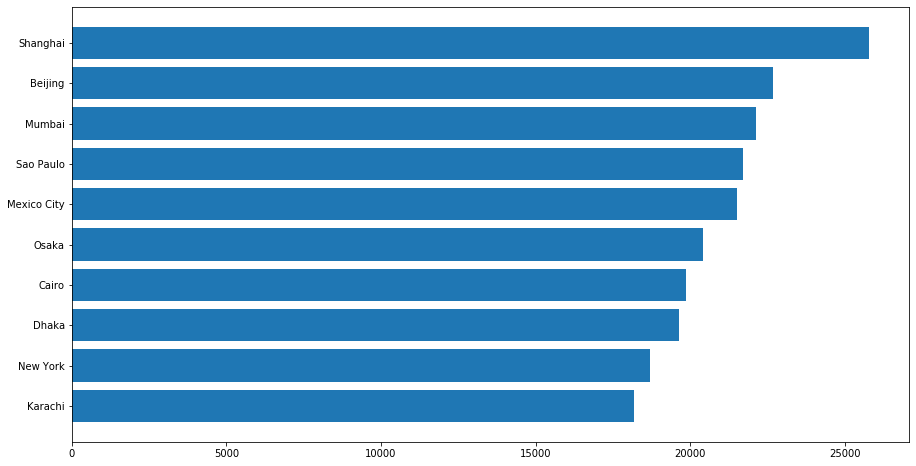

In [110]:
fig,ax = plt.subplots(figsize=(15,8))
ax.barh(c_data3['name'],c_data3['value'])


In [111]:
# colors = dict(zip(['India','Europe','Asia','Latin America','Middle East','North America','Africa'],
#                   ['#adb0ff','#ffb3ff','#90d595','#e48381','#aafbff','#f7bb5f','#eafb50']))
colors = dict(zip(
    ['India', 'Europe', 'Asia', 'Latin America',
     'Middle East', 'North America', 'Africa'],
    ['#adb0ff', '#ffb3ff', '#90d595', '#e48381',
     '#aafbff', '#f7bb5f', '#eafb50']
))
group_lk = c_data2.set_index('name')['group'].to_dict()
group_lk.items()

dict_items([('Agra', 'India'), ('Ahmedabad', 'India'), ('Amsterdam', 'Europe'), ('Ayutthaya', 'Asia'), ('Beijing', 'Asia'), ('Berlin', 'Europe'), ('Bijapur', 'India'), ('Birmingham', 'Europe'), ('Boston', 'North America'), ('Buenos Aires', 'Latin America'), ('Cairo', 'Middle East'), ('Chicago', 'North America'), ('Cuttack', 'India'), ('Delhi', 'India'), ('Dhaka', 'Asia'), ('Edirne', 'Europe'), ('Esfahan', 'Middle East'), ('Fez', 'Middle East'), ('Gauda', 'India'), ('Guangzhou', 'Asia'), ('Hangzhou', 'Asia'), ('Istanbul', 'Europe'), ('Karachi', 'Asia'), ('Kolkatta', 'India'), ('Kyoto', 'Asia'), ('Lisbon', 'Europe'), ('London', 'Europe'), ('Los Angeles', 'North America'), ('Lucknow', 'India'), ('Manchester', 'Europe'), ('Mashhad', 'Middle East'), ('Mexico City', 'Latin America'), ('Moscow', 'Europe'), ('Mumbai', 'India'), ('Nanjing', 'Asia'), ('Naples', 'Europe'), ('New York', 'North America'), ('Osaka', 'Asia'), ('Paris', 'Europe'), ('Pegu', 'Asia'), ('Philadelphia', 'North America'), (

Text(1, 0.4, '2018')

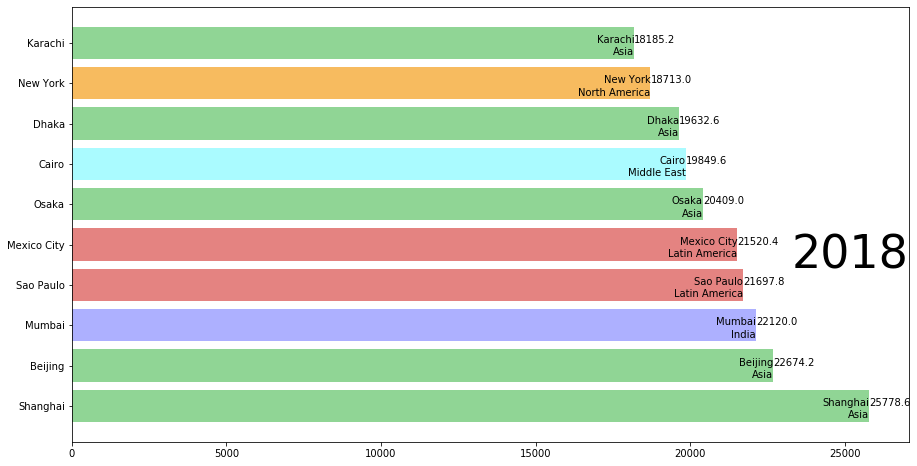

In [112]:
fig,ax = plt.subplots(figsize=(15,8))
c_data3 = c_data3[::-1]
ax.barh(c_data3['name'],c_data3['value'],color=[colors[group_lk[x]] for x in c_data3['name']])
for i,(value,name) in enumerate(zip(c_data3['value'],c_data3['name'])):
    ax.text(value,  i,     name,           ha='right')
    ax.text(value,  i-.30, group_lk[name], ha='right')
    ax.text(value,  i,     value,          ha='left')
ax.text(1,0.4,current_year,transform=ax.transAxes,size=46,ha='right')


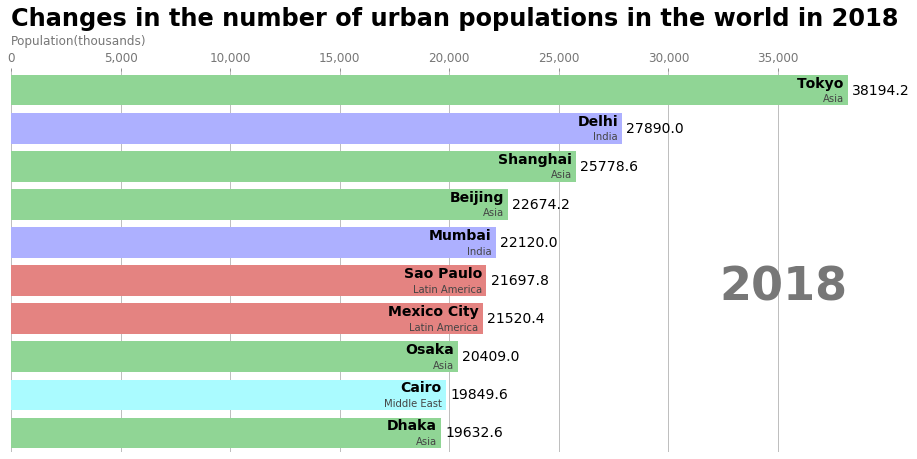

In [113]:
fig,ax = plt.subplots(figsize=(15,7))
def draw_barchart(year):
    c_data3 = c_data2[c_data2['year'].eq(year)].sort_values(by='value',ascending=True).tail(10)
    ax.clear()
    ax.barh(c_data3['name'],c_data3['value'],color=[colors[group_lk[x]] for x in c_data3['name']])
    dx = c_data3['value'].max()/200
    for i,(value,name) in enumerate(zip(c_data3['value'],c_data3['name'])):
        ax.text(value-dx,      i,       name,           size=14,    weight=600,     ha='right',     va='bottom')
        ax.text(value-dx,      i-.30,    group_lk[name],size=10,    color='#444444',ha='right',     va='baseline')
        ax.text(value+dx,      i,       value, size=14,    ha='left',      va='center')
    ax.text(1,.4,year,transform=ax.transAxes,color='#777777',size=46,ha='right',weight=800)
    ax.text(0,1.07,'Population(thousands)',transform=ax.transAxes,size=12,color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x',colors='#777777',labelsize=12)
    ax.set_yticks(())
    ax.margins(0,.01)    # 缩放坐标轴
    ax.grid(which='major',axis='x',linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0,1.12,'Changes in the number of urban populations in the world in %d'%year,transform=ax.transAxes,size=24,weight=600,ha='left')
    plt.box(False)
         
draw_barchart(2018)    

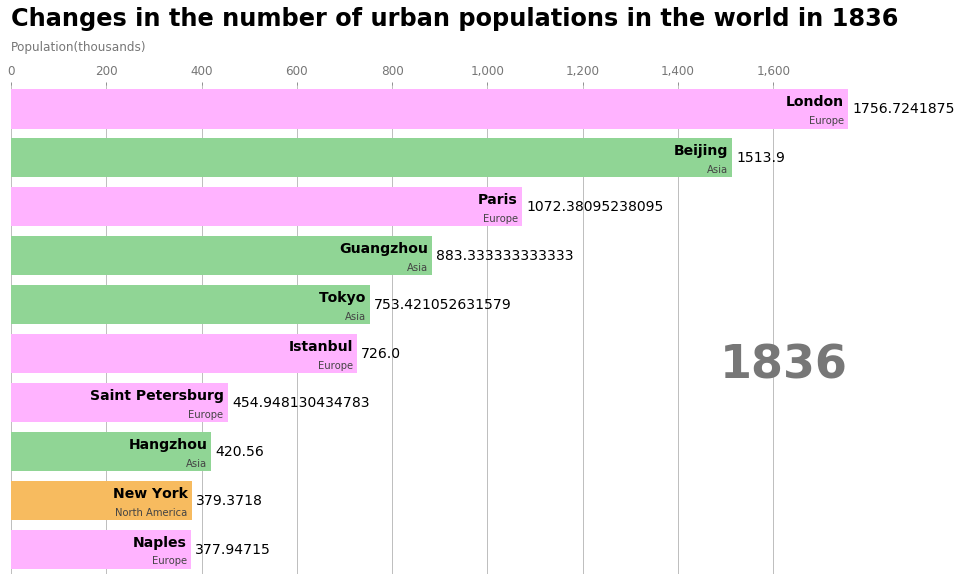

In [114]:
from IPython.display import HTML
fig,ax = plt.subplots(figsize=(15,9))
animator = animation.FuncAnimation(fig,draw_barchart,frames=range(1836,2019))
HTML(animator.to_jshtml())